### Laboratorium 4 - zadania

In [1]:
import os

import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries, slic

#### Zadanie 1

Dane są obrazy `tabby` i `pills`. Wykonaj dla nich segmentację przy użyciu algorytmu SLIC. Celem jest uzyskanie **jednolitych**  superpikseli, a więc zawierających tylko fragmenty obiektów lub tylko tła (a nie jednego i drugiego naraz). Przeanalizuj zachowanie algorytmu dla różnej liczby superpikseli i parametru sigma.

Zwróć uwagę, że wynikiem działania scikitowej implementacji SLIC - [`skimage.segmentation.slic`](https://scikit-image.org/docs/stable/api/skimage.segmentation.html#skimage.segmentation.slic) - (podobnie jak wielu innych algorytmów klasyfikacyjnych) jest obraz typu `np.int64` przyporządkowujący każdemu pikselowi obrazu wejściowego indeks superpiksela. Takiej reprezentacji oczekuje też funkcja [`mark_boundaries`](https://scikit-image.org/docs/stable/api/skimage.segmentation.html#skimage.segmentation.mark_boundaries).

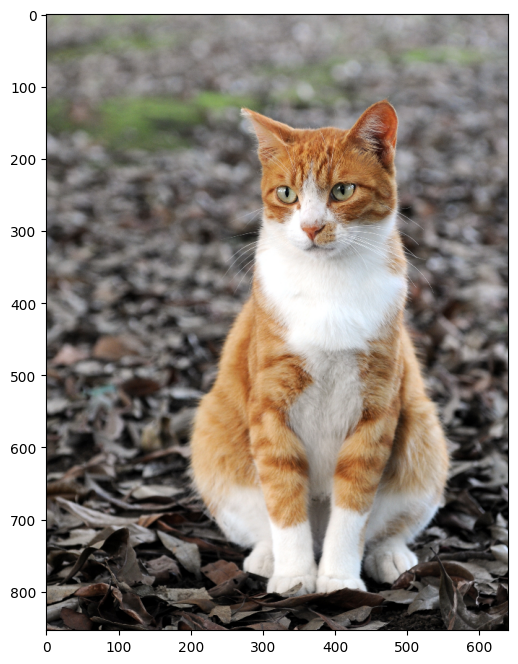

In [2]:
_ = cv2.imread('tabby.jpg')[..., ::-1]
tabby = cv2.resize(_, dsize=None, fx=0.3, fy=0.3)
plt.subplots(1,1,figsize=(8,8))[1].imshow(tabby);

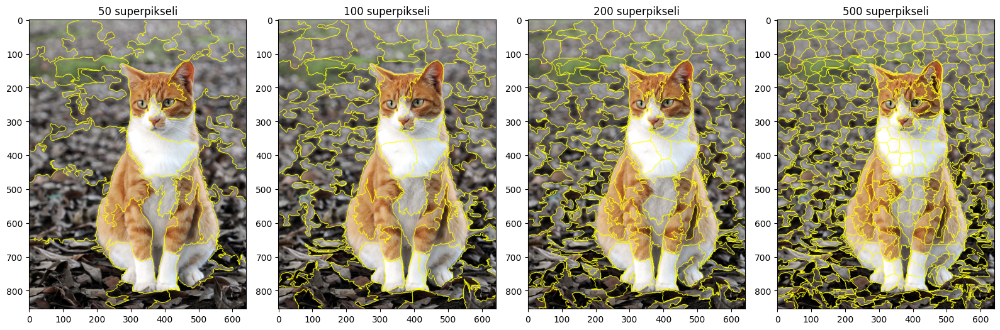

In [90]:
n_segments = [50, 100, 200, 500]

fig, ax = plt.subplots(1, 4, figsize=(16, 6))
for i, n in enumerate(n_segments):
    segments = slic(tabby, n_segments=n, sigma=1)
    ax[i].imshow(mark_boundaries(tabby, segments))
    ax[i].set_title(f'{n} superpikseli')
plt.tight_layout()
plt.show()

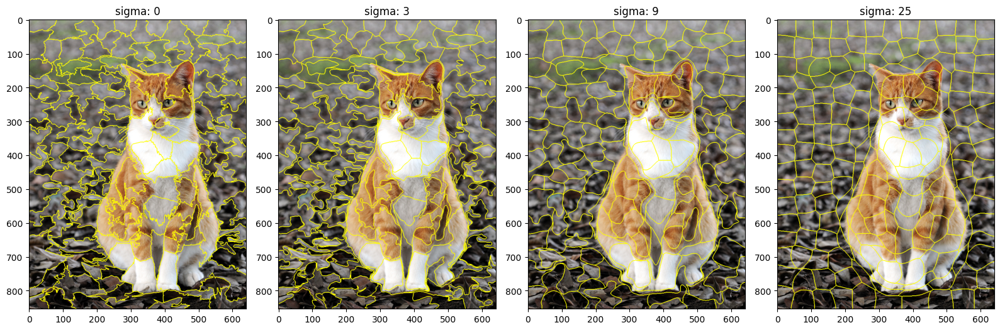

In [4]:
sigmas = [0, 3, 9, 25]

fig, ax = plt.subplots(1, 4, figsize=(16, 6))
for i, sigma in enumerate(sigmas):
    segments = slic(tabby, n_segments=200, sigma=sigma)
    ax[i].imshow(mark_boundaries(tabby, segments))
    ax[i].set_title(f'sigma: {sigma}')
plt.tight_layout()
plt.show()

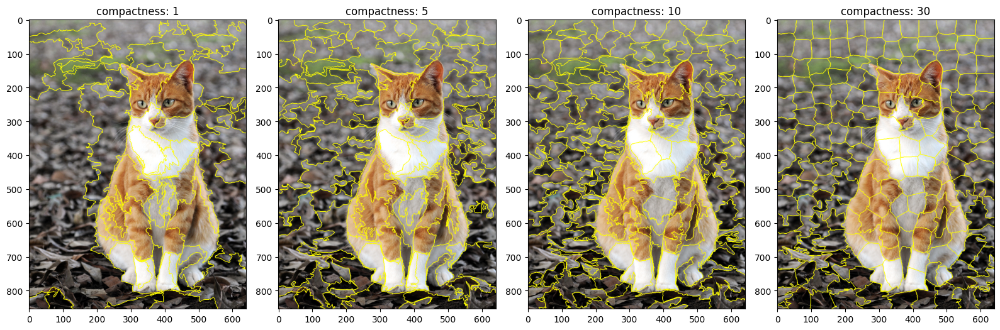

In [59]:
compactnesses = [1, 5, 10, 30]

fig, ax = plt.subplots(1, 4, figsize=(16, 6))
for i, compactness in enumerate(compactnesses):
    segments = slic(tabby, n_segments=200, sigma=1, compactness=compactness)
    # print(max(segments.flatten()))
    ax[i].imshow(mark_boundaries(tabby, segments))
    ax[i].set_title(f'compactness: {compactness}')
plt.tight_layout()
plt.show()

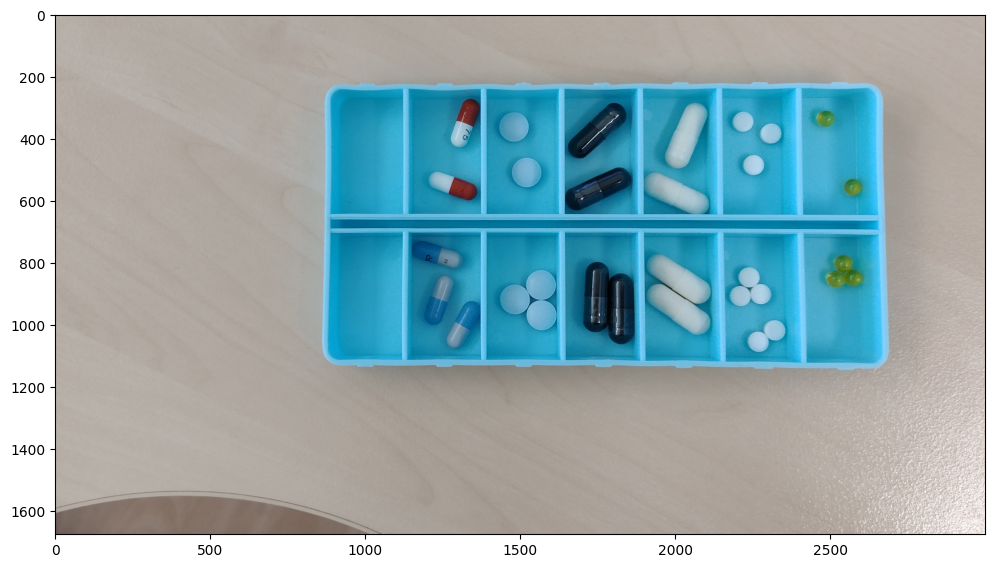

In [57]:
pills = cv2.imread('pills.png')[..., ::-1]
plt.subplots(1,1,figsize=(12,8))[1].imshow(pills);

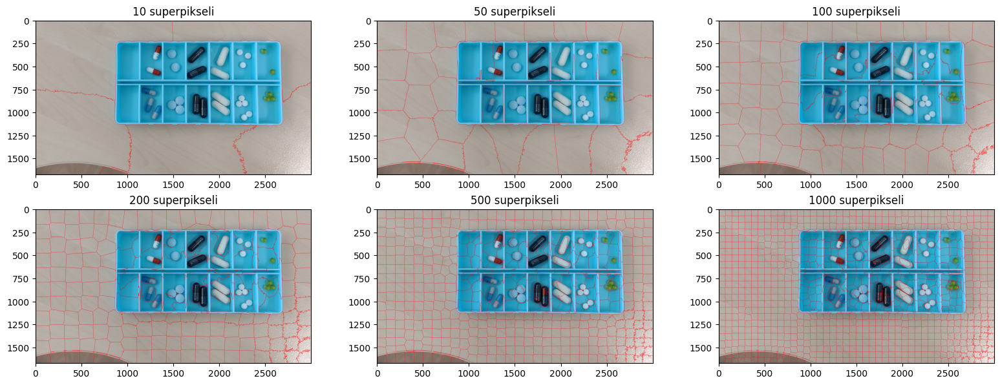

In [7]:
n_segments = [10, 50, 100, 200, 500, 1000]

fig, ax = plt.subplots(2, 3, figsize=(16, 6))

for i, n in enumerate(n_segments):
    segments = slic(pills, n_segments=n, sigma=1)
    ax[i // 3, i % 3].imshow(mark_boundaries(pills, segments, color=(1, 0, 0), mode='thick'))
    ax[i // 3, i % 3].set_title(f'{n} superpikseli')
plt.tight_layout()
plt.show()

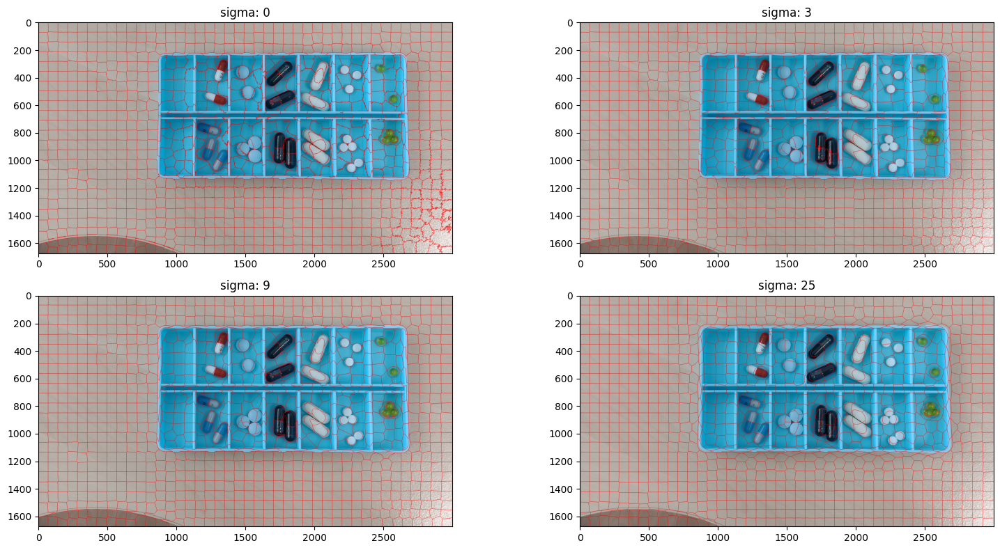

In [8]:
sigmas = [0, 3, 9, 25]

fig, ax = plt.subplots(2, 2, figsize=(16, 8))
for i, sigma in enumerate(sigmas):
    segments = slic(pills, n_segments=1000, sigma=sigma)
    ax[i // 2, i % 2].imshow(mark_boundaries(pills, segments, color=(1, 0, 0), mode='thick'))
    ax[i // 2, i % 2].set_title(f'sigma: {sigma}')
plt.tight_layout()
plt.show()

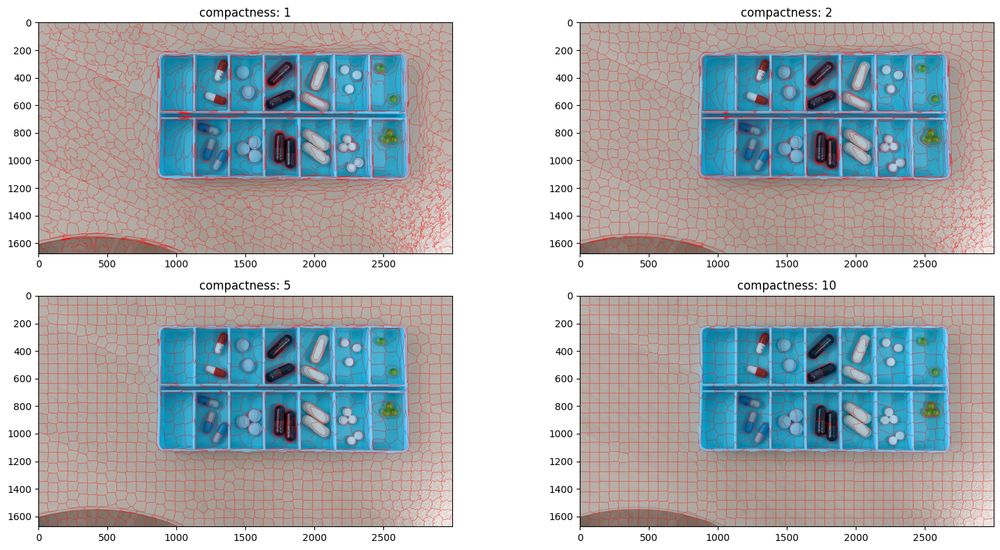

In [67]:
compactnesses = [1, 2, 5, 10]

fig, ax = plt.subplots(2, 2, figsize=(16, 8))
for i, compactness in enumerate(compactnesses):
    segments = slic(pills, n_segments=1000, sigma=5, compactness=compactness)
    ax[i // 2, i % 2].imshow(mark_boundaries(pills, segments, color=(1, 0, 0), mode='thick'))
    ax[i // 2, i % 2].set_title(f'compactness: {compactness}')
plt.tight_layout()
plt.show()

#### Zadanie 2

Dla obrazu `tabby` wykonaj post-processing segmentacji SLIC by uzyskać dwa jednorodne obszary: jeden zawierający wyłącznie kota, drugi zawierający wyłącznie tło.

Można to zadanie potraktować jako binaryzację na poziomie superpikseli i zrealizować je za pomocą progowania. 
Można też potraktować je jako klasteryzację superpikseli i wykorzystać np. [`cv2.kmeans`](https://docs.opencv.org/4.x/d5/d38/group__core__cluster.html#ga9a34dc06c6ec9460e90860f15bcd2f88).  
Niezależnie od wybranej ścieżki, konieczne będzie opisanie każdego z superpikseli za pomocą jakiejś *cechy* go opisującej (lub kilku cech). Najprostszymi cechami mogą być np. średnie wartości składowych barwy pikseli wchodzących w skład superpiksela.  
Do zastanowienia: jakie parametry SLICa wybrać jako podstawę w tym zadaniu?

Zaprezentuj wyniki albo za pomocą `mark_boundaries` albo wyświetlając maskę binarną.

---

NumPy pro-tip: aby uzyskać zbiór wszystkich pikseli obrazu o wartości np. 3 możesz użyć notacji: ```obraz==3```. Wynikiem jest macierz boolowska, której można używać jako selektor. Np. aby na obrazie `A` wyzerować wszystkie piksele, którym w obrazie `B` odpowiada wartość 5, możesz napisać:  
```A[B==5] = 0```  
Ten zapis jest **znacznie** szybszy niż manualne iterowanie po obrazach i sprawdzanie warunków if-ami.

---

Przykładowe użycie `cv2.kmeans` (więcej możesz poczytać np. [tutaj](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_ml/py_kmeans/py_kmeans_opencv/py_kmeans_opencv.html)):
```python
c, labels, centers = cv2.kmeans(
    data=data,  # np.ndarray typu float o wymiarach NxK gdzie N to liczba sampli (u nas: superpikseli), K - liczba cech
    K=2,        # oczekiwana liczba klastrów
    bestLabels=None,
    criteria=(cv2.TERM_CRITERIA_EPS, 10, 1.0),  # przykładowe kryteria stopu
    attempts=1, # liczba powtórzeń algorytmu
    flags=cv2.KMEANS_RANDOM_CENTERS  # sposób inicjalizacji klastrów
)
```

Funkcja ta zwraca krotkę, której najważniejszym komponentem jest ten drugi (tu: `labels`), tj. macierz o wymiarach Nx1, zawierająca indeks klastra przypisanego i-temu samplowi.

In [9]:
# zacznij od przygotowania macierzy wejściowej (data) reprezentującej superpiksele jako punkty danych

In [69]:
def binarize(img, n_segments=100, sigma=1, method='kmeans', superpixel_value_method='mean', canals='rgb', kmeans_clusters=2, compactness=10):
    superpixels = slic(img, n_segments=n_segments, sigma=sigma, compactness=compactness, channel_axis=-1 if len(img.shape) == 3 else None)
    if canals == 'hsv':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

    superpixel_labels = np.unique(superpixels)
    img2 = np.zeros(img.shape[:2], dtype=np.uint8)

    colors = []
    for label in superpixel_labels:
        if superpixel_value_method == 'mean':
            color = img[superpixels == label].mean(axis=0)
        elif superpixel_value_method == 'median':
            color = np.median(img[superpixels == label], axis=0)
            
        colors.append(color)

    colors = np.array(colors, dtype=np.float32)

    
    # colors = cv2.cvtColor(np.array([colors], dtype=np.float32), cv2.COLOR_RGB2HSV)[0]

    if method == 'kmeans':
        _, binarized_labels, _ = cv2.kmeans(data=colors, K=kmeans_clusters, attempts=5, flags=cv2.KMEANS_RANDOM_CENTERS, bestLabels=None,
                                criteria=(cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0))
        binarized_labels = binarized_labels.flatten()
    
    elif method == 'threshold':
        gray_values = colors.mean(axis=1)
        gray_values = (gray_values * 255 / gray_values.max()).astype(np.uint8)
        _, threshold = cv2.threshold(gray_values, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        binarized_labels = (gray_values > threshold).astype(np.uint8)[:,0]
    
    for superpixel_label, binarized_label in zip(superpixel_labels, binarized_labels):
        img2[superpixels == superpixel_label] = binarized_label
    
    return img2

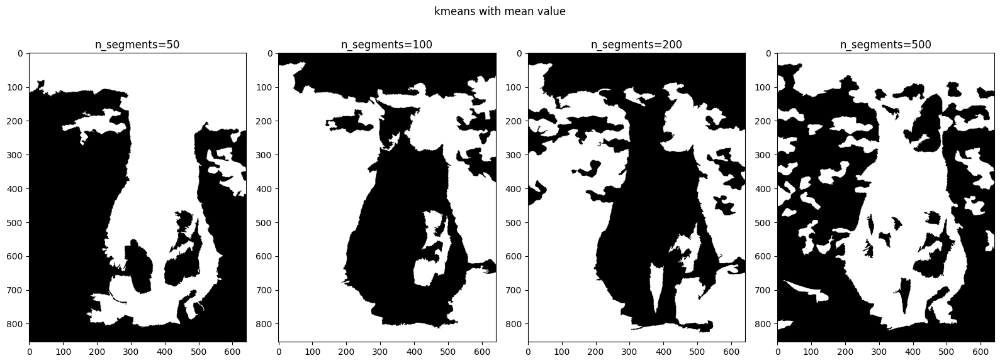

In [11]:
plt.figure(figsize=(16, 6))
plt.suptitle("kmeans with mean value")

for i, n_segments in enumerate([50, 100, 200, 500]):
    plt.subplot(1, 4, i+1)
    plt.title(f'n_segments={n_segments}')
    plt.imshow(binarize(tabby, n_segments=n_segments, sigma=0, method='kmeans', superpixel_value_method='mean'), cmap='gray')

plt.tight_layout()
plt.show()

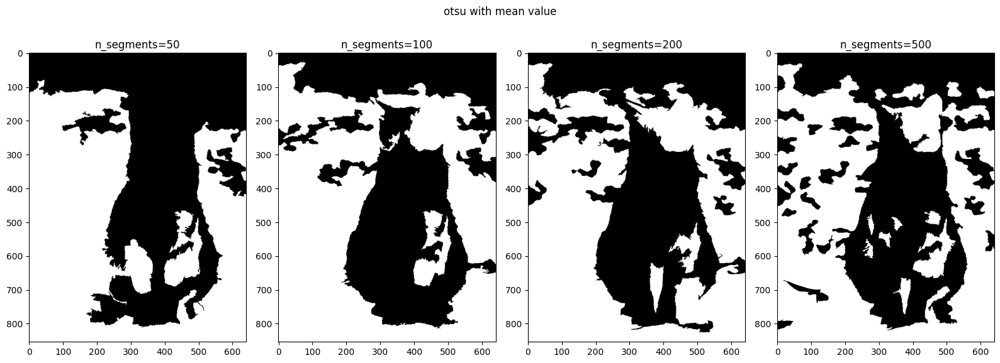

In [12]:
plt.figure(figsize=(16, 6))
plt.suptitle("otsu with mean value")

for i, n_segments in enumerate([50, 100, 200, 500]):
    plt.subplot(1, 4, i+1)
    plt.title(f'n_segments={n_segments}')
    plt.imshow(binarize(tabby, n_segments=n_segments, sigma=0, method='threshold', superpixel_value_method='mean'), cmap='gray')

plt.tight_layout()
plt.show()

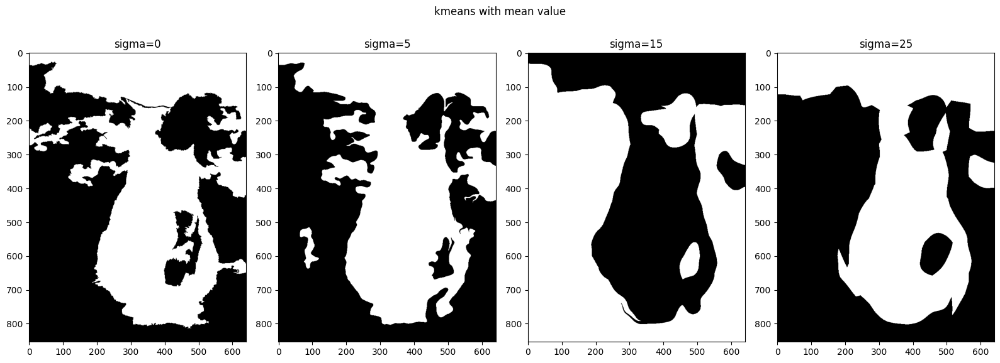

In [13]:
plt.figure(figsize=(16, 6))
plt.suptitle("kmeans with mean value")

for i, sigma in enumerate([0, 5, 15, 25]):
    plt.subplot(1, 4, i+1)
    plt.title(f'sigma={sigma}')
    plt.imshow(binarize(tabby, n_segments=100, sigma=sigma, method='kmeans', superpixel_value_method='mean'), cmap='gray')

plt.tight_layout()
plt.show()

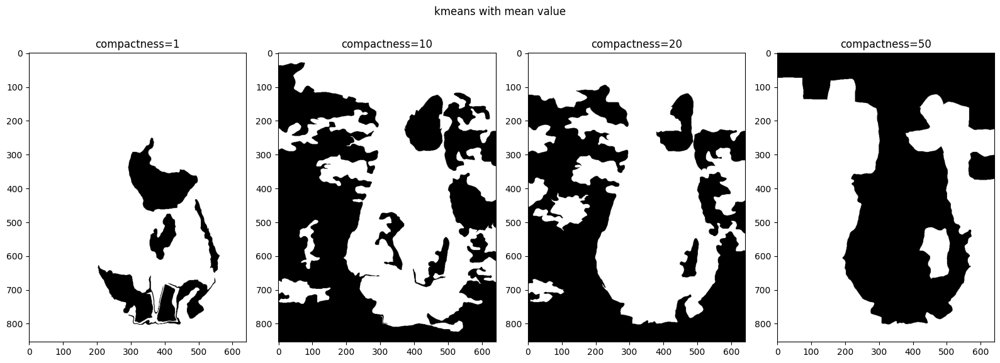

In [71]:
plt.figure(figsize=(16, 6))
plt.suptitle("kmeans with mean value")

for i, comp in enumerate([1, 10, 20, 50]):
    plt.subplot(1, 4, i+1)
    plt.title(f'compactness={comp}')
    plt.imshow(binarize(tabby, n_segments=100, sigma=3, compactness=comp, method='kmeans', superpixel_value_method='mean'), cmap='gray')

plt.tight_layout()
plt.show()

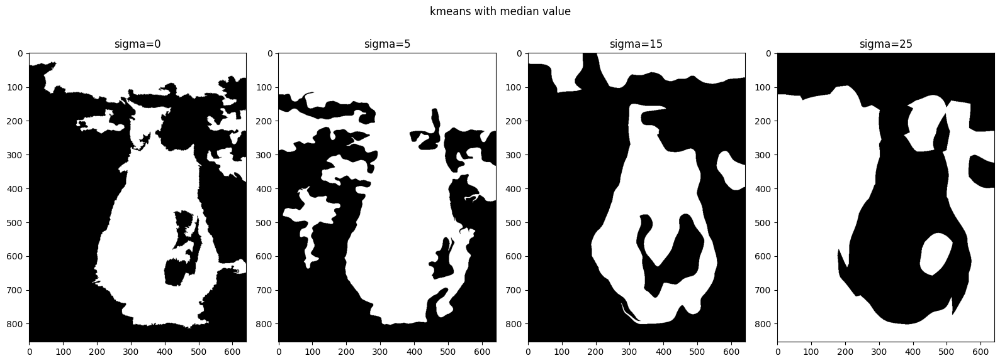

In [15]:
plt.figure(figsize=(16, 6))
plt.suptitle("kmeans with median value")

for i, sigma in enumerate([0, 5, 15, 25]):
    plt.subplot(1, 4, i+1)
    plt.title(f'sigma={sigma}')
    plt.imshow(binarize(tabby, n_segments=100, sigma=sigma, method='kmeans', superpixel_value_method='median'), cmap='gray')

plt.tight_layout()
plt.show()

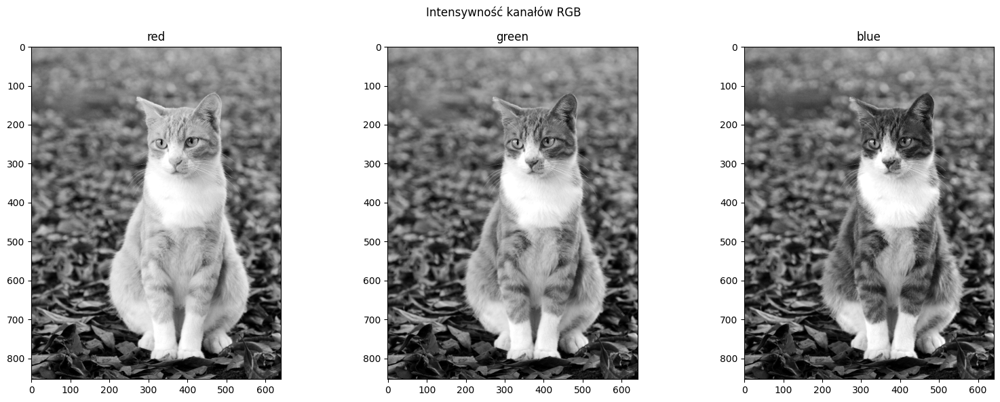

In [16]:
plt.figure(figsize=(16, 6))
plt.suptitle("Intensywność kanałów RGB")

for i, color in enumerate(['red', 'green', 'blue']):
    plt.subplot(1, 3, i+1)
    plt.title(color)
    plt.imshow(tabby[:,:,i], cmap='gray')

plt.tight_layout()
plt.show()

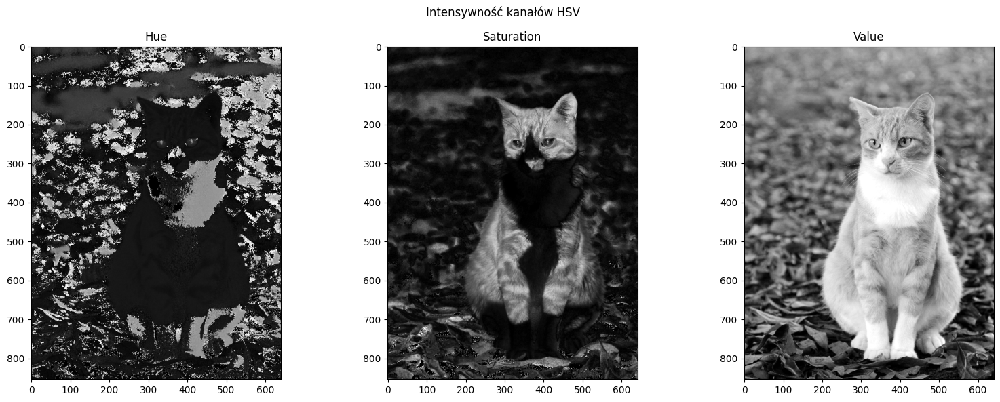

In [43]:
tabby_hsv = cv2.cvtColor(tabby, cv2.COLOR_RGB2HSV)

plt.figure(figsize=(16, 6))
plt.suptitle("Intensywność kanałów HSV")

for i, color in enumerate(['Hue', 'Saturation', 'Value']):
    plt.subplot(1, 3, i+1)
    plt.title(color)
    plt.imshow(tabby_hsv[:,:,i], cmap='gray')

plt.tight_layout()
plt.show()

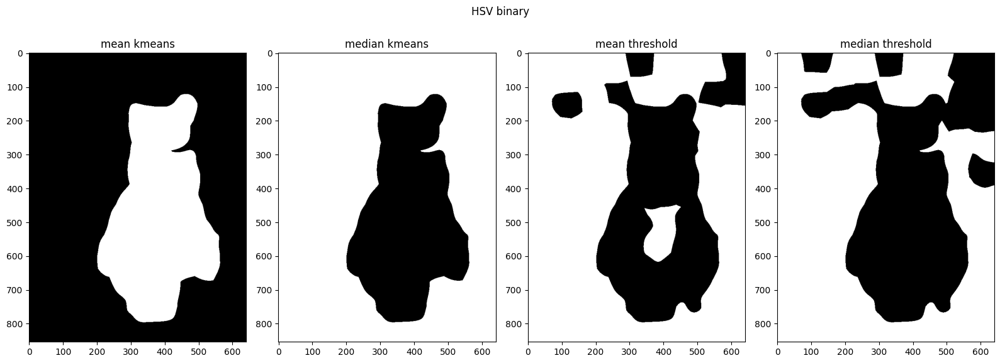

In [20]:
plt.figure(figsize=(16, 6))
plt.suptitle("HSV binary")

for i, (method, superpixel_value_method) in enumerate([('kmeans', 'mean'), ('kmeans', 'median'), ('threshold', 'mean'), ('threshold', 'median')]):
    plt.subplot(1, 4, i+1)
    plt.title(f'{superpixel_value_method} {method}')
    plt.imshow(binarize(tabby, n_segments=100, sigma=15, compactness=20, method=method, superpixel_value_method=superpixel_value_method, canals='hsv'), cmap='gray')

plt.tight_layout()
plt.show()

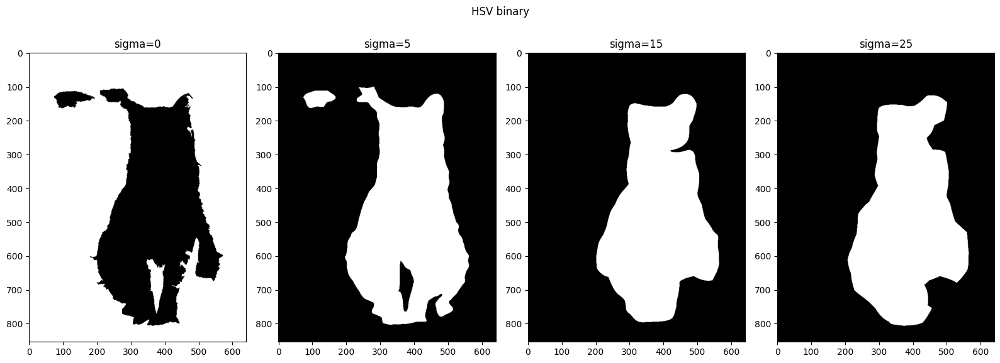

In [73]:
plt.figure(figsize=(16, 6))
plt.suptitle("HSV binary")

for i, sigma in enumerate([0, 5, 15, 25]):
    plt.subplot(1, 4, i+1)
    plt.title(f'sigma={sigma}')
    plt.imshow(binarize(tabby, n_segments=100, sigma=sigma, compactness=20, method='kmeans', superpixel_value_method='median', canals='hsv'), cmap='gray')

plt.tight_layout()
plt.show()

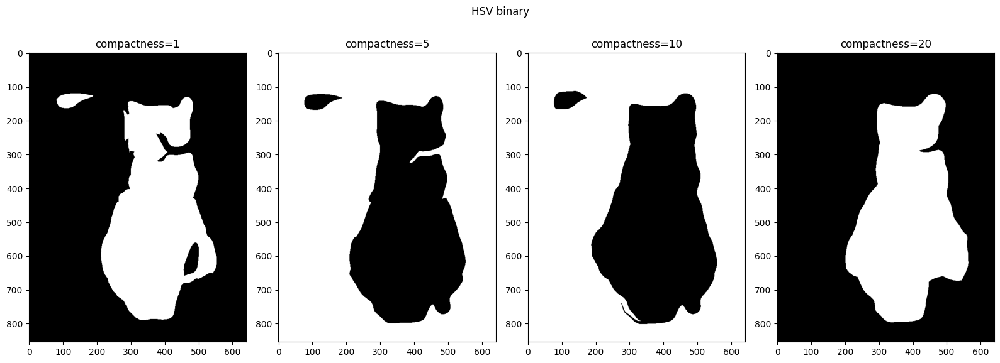

In [19]:
plt.figure(figsize=(16, 6))
plt.suptitle("HSV binary")

for i, compactness in enumerate([1, 5, 10, 20]):
    plt.subplot(1, 4, i+1)
    plt.title(f'compactness={compactness}')
    plt.imshow(binarize(tabby, n_segments=100, sigma=15, compactness=compactness, method='kmeans', superpixel_value_method='median', canals='hsv'), cmap='gray')

plt.tight_layout()
plt.show()

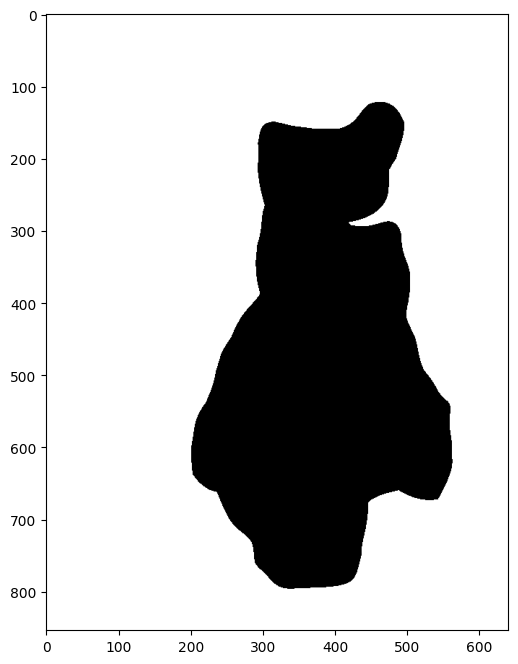

In [88]:
plt.subplots(1,1,figsize=(8,8))[1].imshow(binarize(tabby, n_segments=100, sigma=15, compactness=20, method='kmeans', superpixel_value_method='median', canals='hsv'), cmap='gray')

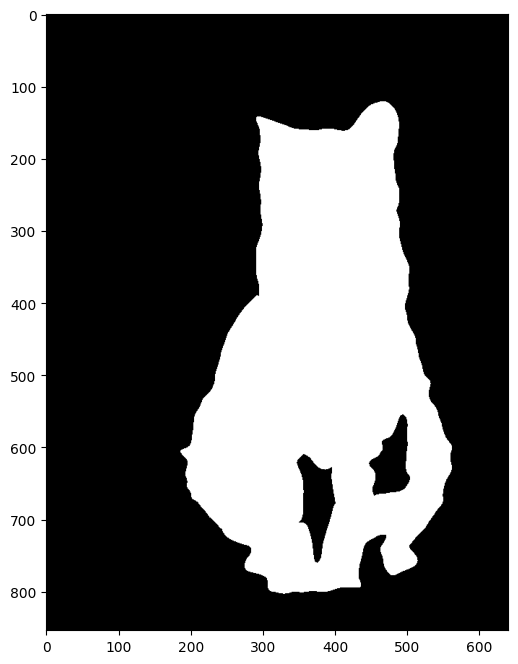

In [89]:
plt.subplots(1,1,figsize=(8,8))[1].imshow(binarize(tabby, n_segments=100, sigma=5, compactness=25, method='kmeans', superpixel_value_method='median', canals='hsv'), cmap='gray')


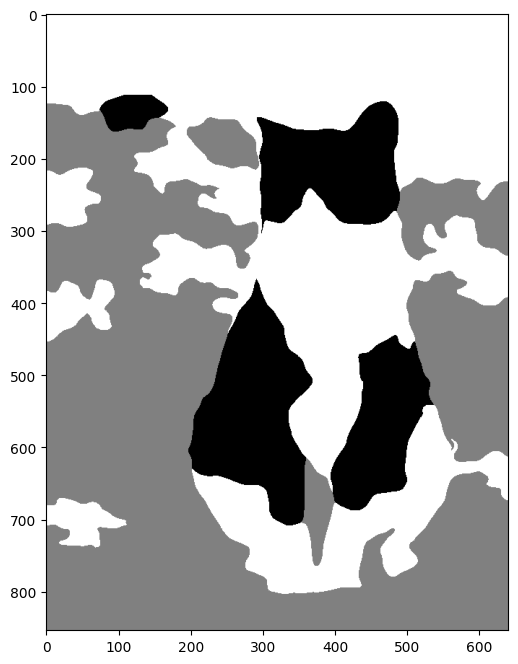

In [80]:
plt.subplots(1,1,figsize=(8,8))[1].imshow(binarize(tabby, n_segments=100, sigma=5, compactness=20, method='kmeans', superpixel_value_method='median', canals='hsv', kmeans_clusters=3), cmap='gray')